In [27]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy
import sys
import os
import pickle
import librosa
import librosa.display
from IPython.display import Audio
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, minmax_scale, StandardScaler
import tensorflow as tf
from tensorflow import keras
import librosa.display
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout, GlobalAveragePooling2D 
import seaborn as sn
from sklearn.metrics import classification_report, confusion_matrix

# EDA

In [3]:
data_path = '/kaggle/input/gtzan-dataset-music-genre-classification/Data'
audio_path = os.path.join(data_path, 'genres_original')

genres = os.listdir(audio_path)

## Waveform

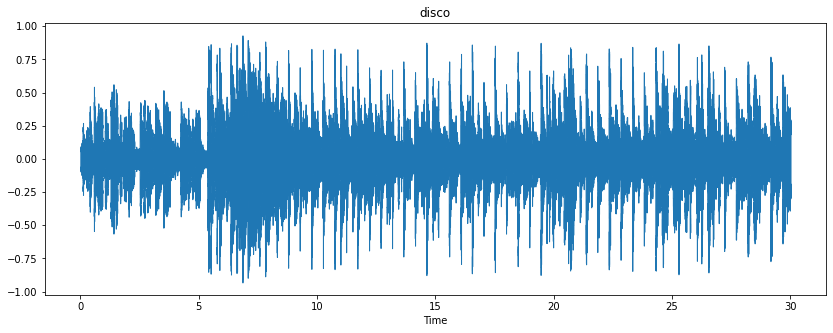

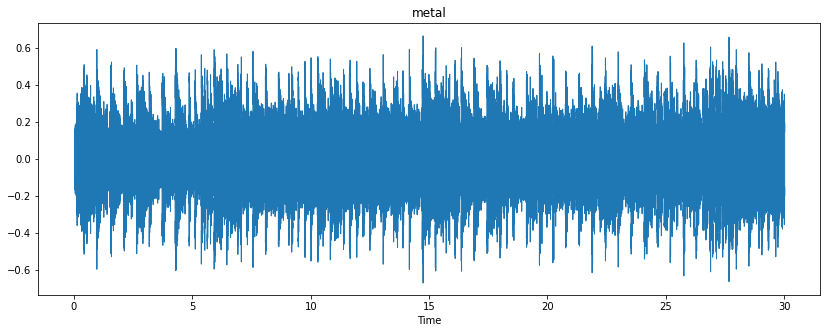

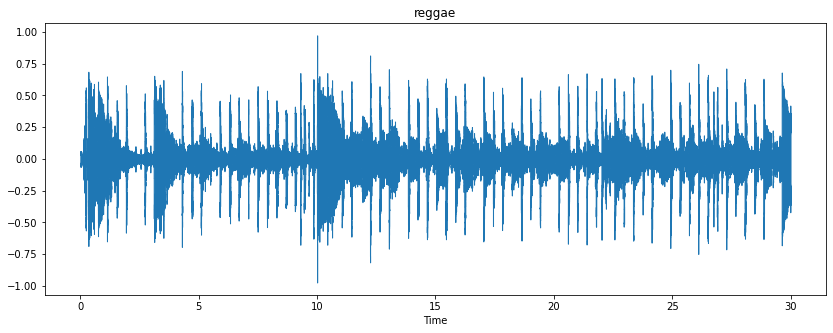

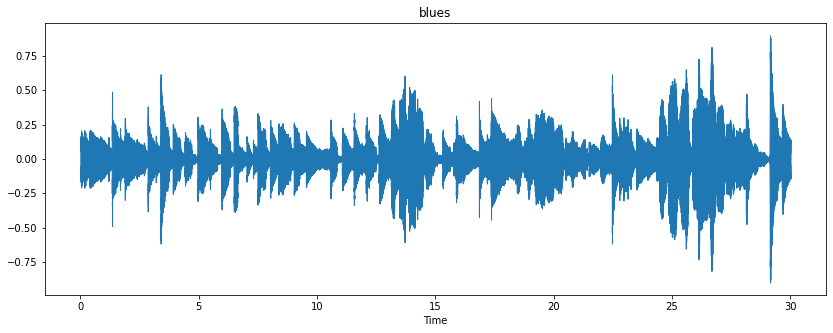

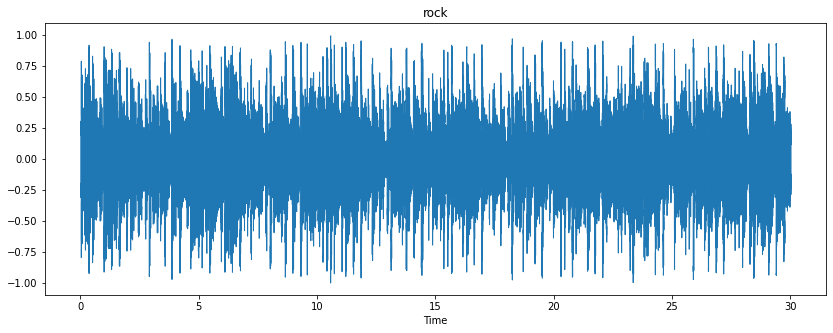

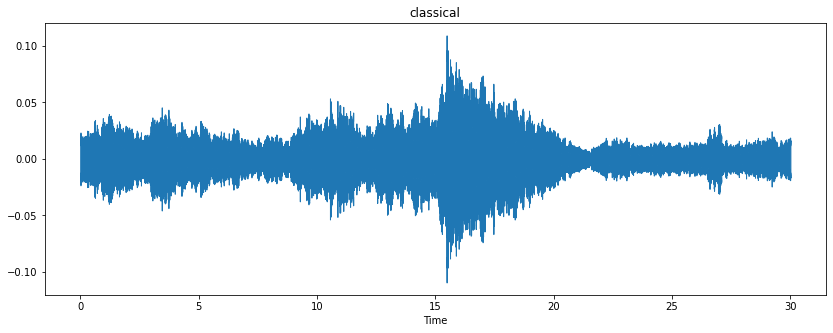

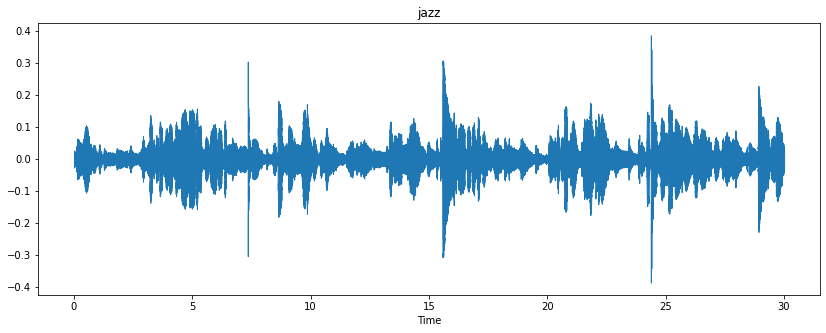

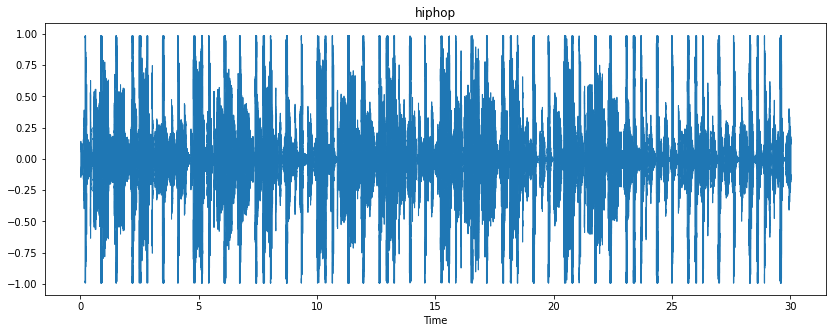

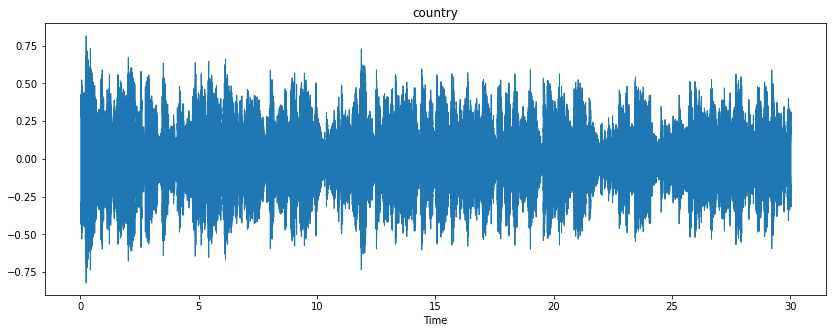

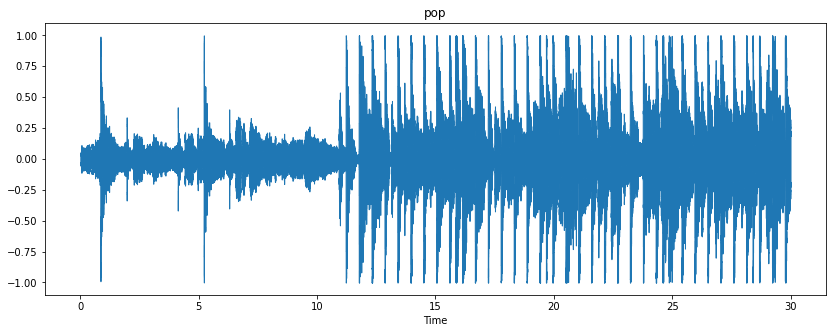

In [4]:
for g in genres:
    g_path = os.path.join(audio_path, g)
    first_audio_path = os.path.join(g_path, os.listdir(g_path)[0])
    x, sr = librosa.load(first_audio_path)
    
    plt.figure(figsize=(14, 5))
    librosa.display.waveshow(x, sr=sr)
    plt.title(g)
    plt.show()

## Spectrogram

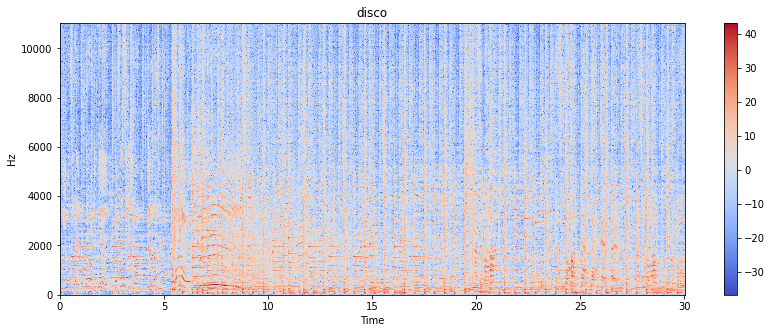

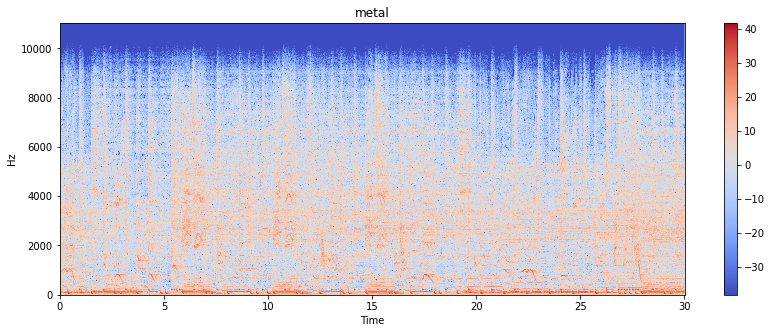

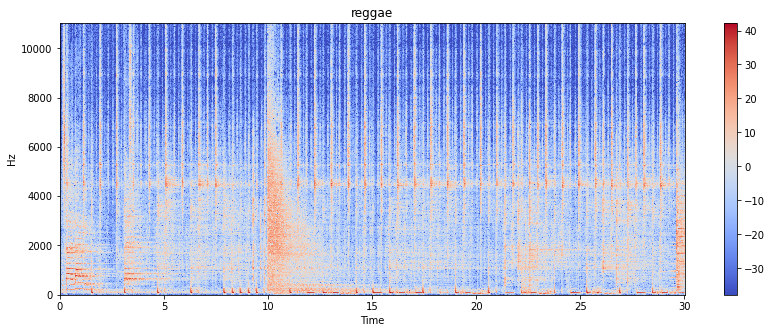

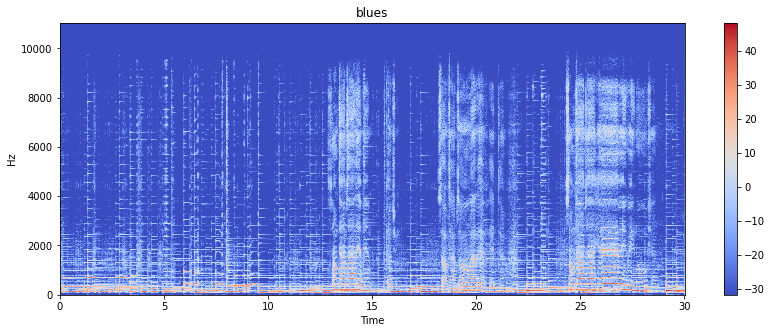

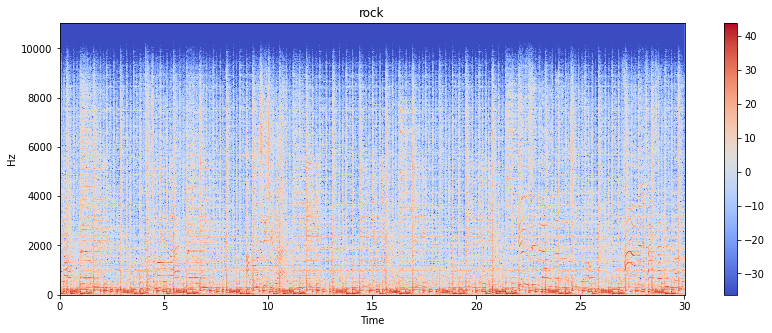

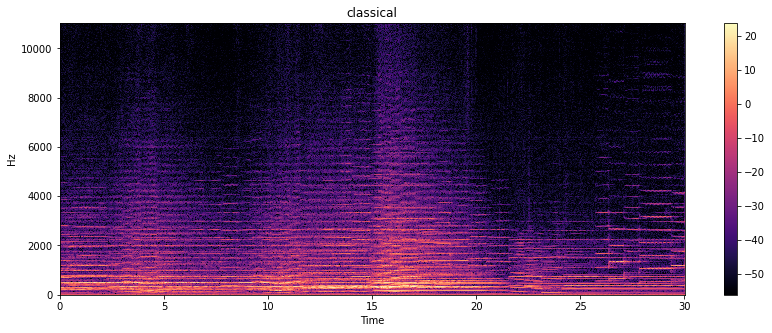

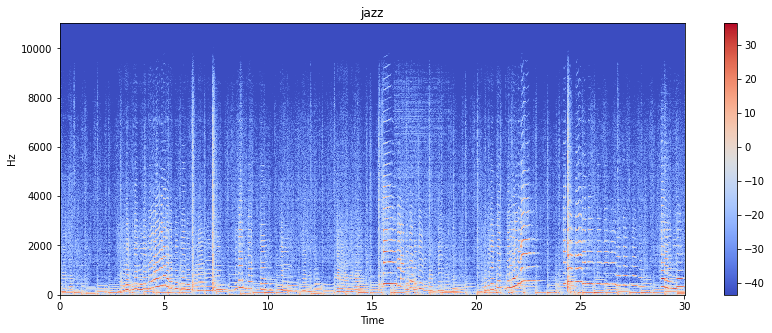

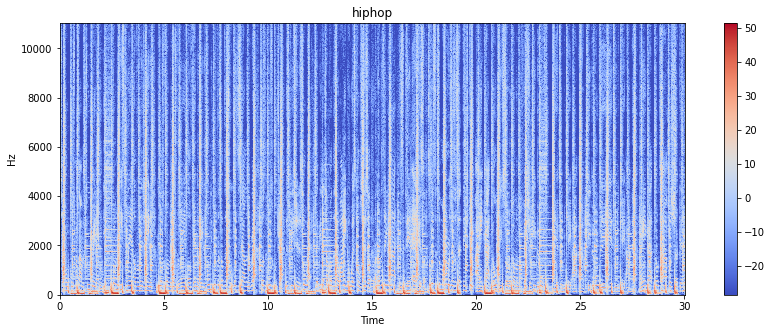

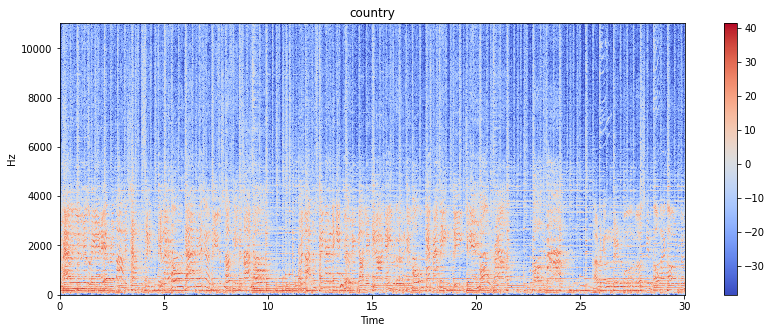

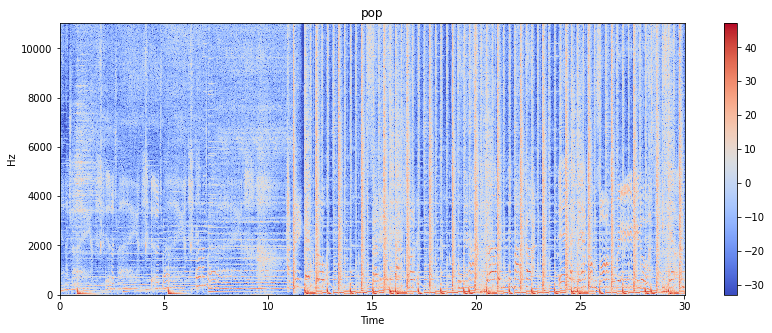

In [5]:
for g in genres:
    g_path = os.path.join(audio_path, g)
    first_audio_path = os.path.join(g_path, os.listdir(g_path)[0])
    
    x, sr = librosa.load(first_audio_path)
    X = librosa.stft(x)
    Xdb = librosa.amplitude_to_db(abs(X))
    
    plt.figure(figsize= (14, 5))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis= 'hz')
    plt.title(g)
    plt.colorbar()

## Spectral Rolloff

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.0096228   0.00432373  0.01927734 ...  0.02547241  0.02220703
  0.0419519 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


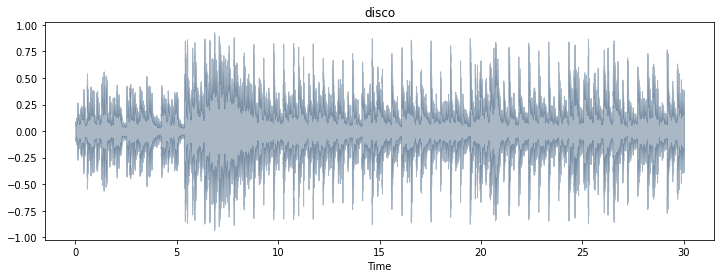

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.06626343  0.00694824  0.01396728 ... -0.12336182 -0.04142212
 -0.06611084] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


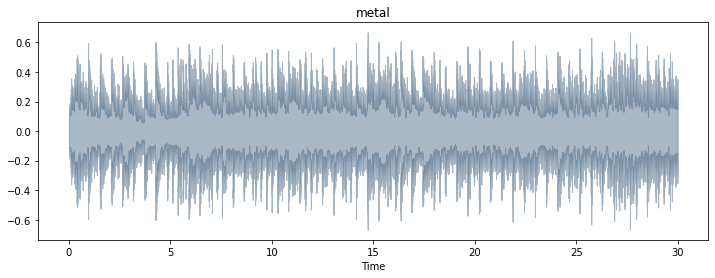

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[0.07112671 0.04997803 0.02208496 ... 0.04512573 0.07921387 0.03316284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


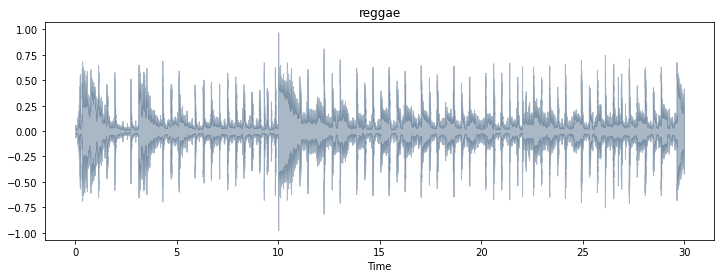

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.00055908 -0.00623535 -0.002146   ...  0.0775354   0.08672119
  0.08815552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


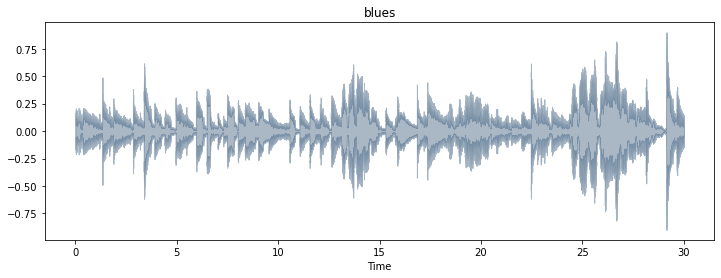

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.0123999  -0.08103394 -0.15448974 ...  0.03685547  0.00789429
 -0.04944824] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


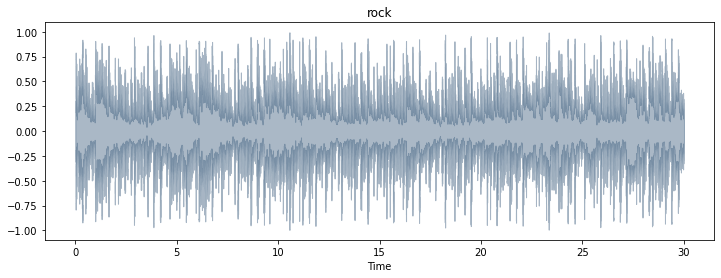

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[ 0.01784302  0.01726318  0.01582886 ...  0.00108887 -0.00077271
 -0.00013184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


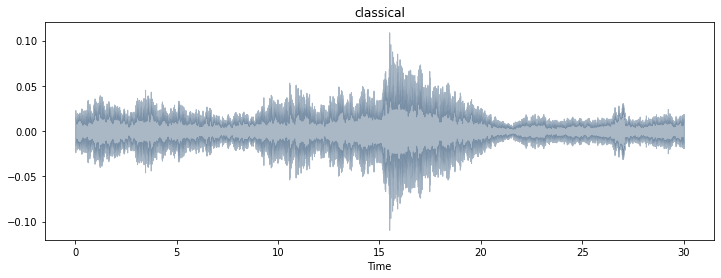

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[ 0.01662231  0.02126099  0.02037598 ... -0.01328491 -0.01392578
 -0.01212524] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


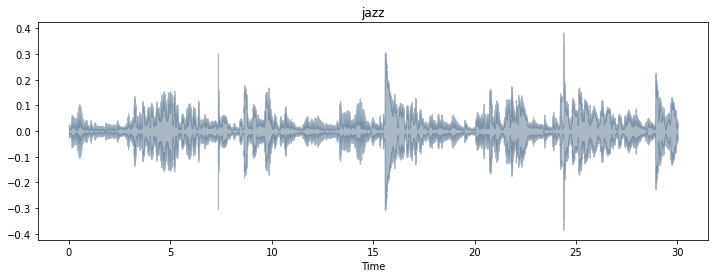

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[ 0.05315185  0.10747314  0.06752563 ... -0.02521729  0.01027466
  0.01268555] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


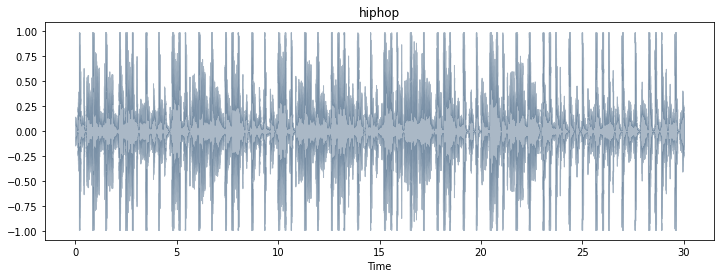

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.09757446 -0.1485083  -0.11939453 ...  0.12965943  0.13826539
  0.13832642] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


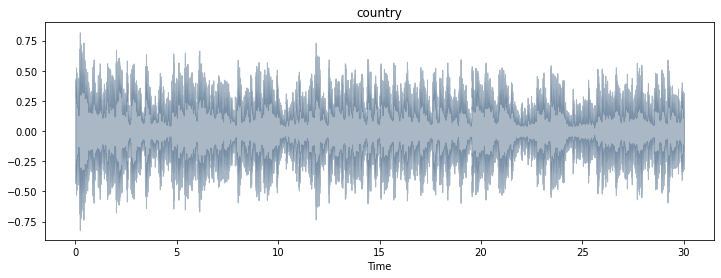

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[0.01137329 0.00295044 0.01338745 ... 0.18050171 0.17552735 0.16499878] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


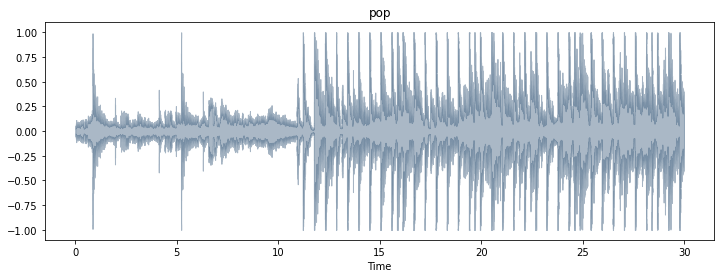

In [6]:
from sklearn.preprocessing import normalize

for g in genres:
    g_path = os.path.join(audio_path, g)
    first_audio_path = os.path.join(g_path, os.listdir(g_path)[0])
    
    x, sr = librosa.load(first_audio_path)
    spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
    
    plt.figure(figsize=(12, 4))
    librosa.display.waveshow(x, sr=sr, alpha=0.4, color="#2B4F72")
    plt.title(g)
    plt.show()

## Chroma Feature

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.0196228  -0.00567627  0.00927734 ...  0.01547241  0.01220703
  0.0319519 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


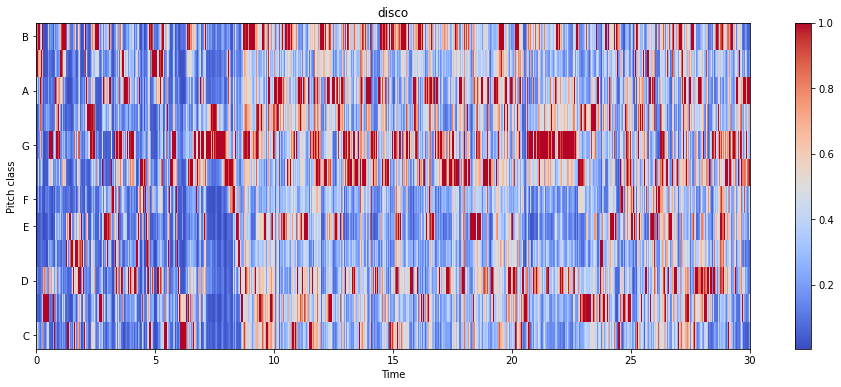

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.07626343 -0.00305176  0.00396729 ... -0.13336182 -0.05142212
 -0.07611084] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


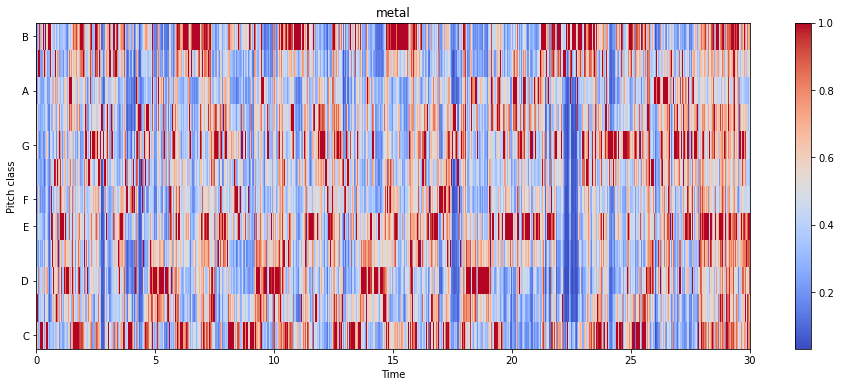

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[0.06112671 0.03997803 0.01208496 ... 0.03512573 0.06921387 0.02316284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


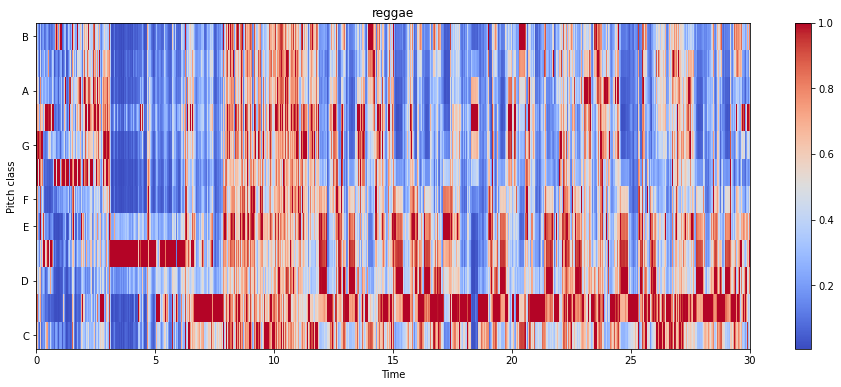

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.01055908 -0.01623535 -0.012146   ...  0.0675354   0.07672119
  0.07815552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


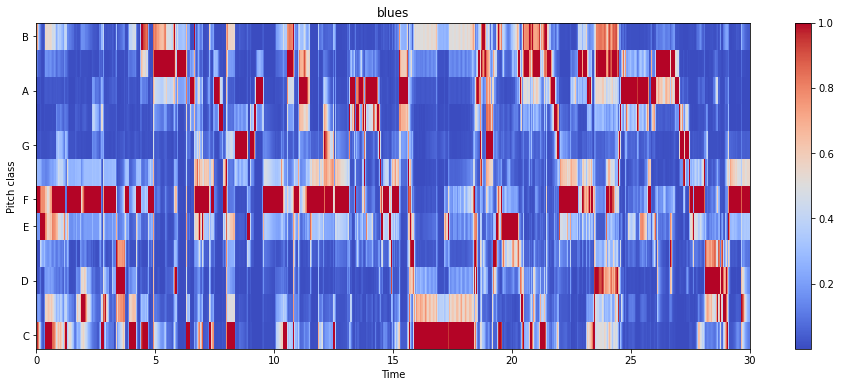

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.0223999  -0.09103394 -0.16448975 ...  0.02685547 -0.00210571
 -0.05944824] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


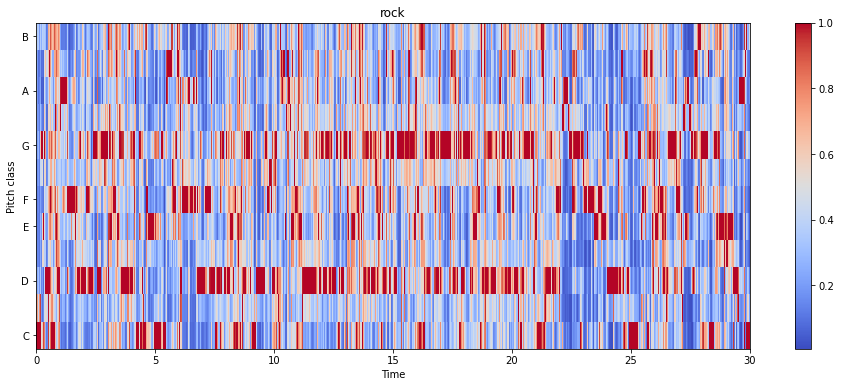

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[ 0.00784302  0.00726318  0.00582886 ... -0.00891113 -0.01077271
 -0.01013184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


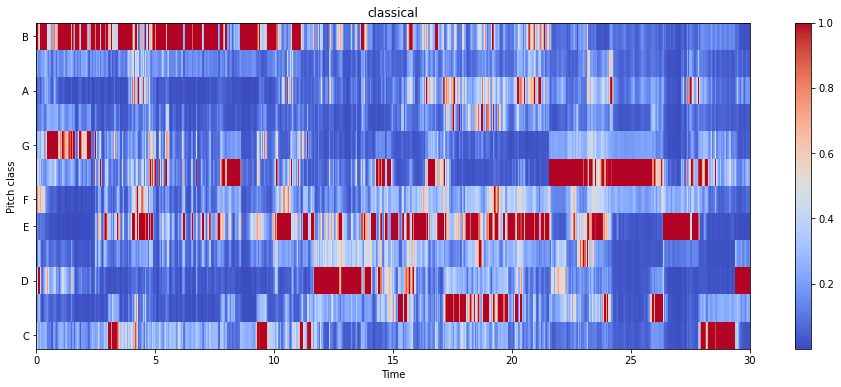

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[ 0.00662231  0.01126099  0.01037598 ... -0.02328491 -0.02392578
 -0.02212524] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


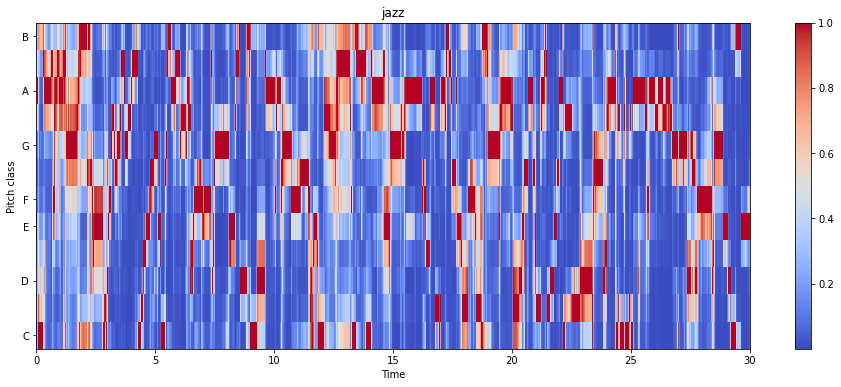

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[ 0.04315186  0.09747314  0.05752563 ... -0.03521729  0.00027466
  0.00268555] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


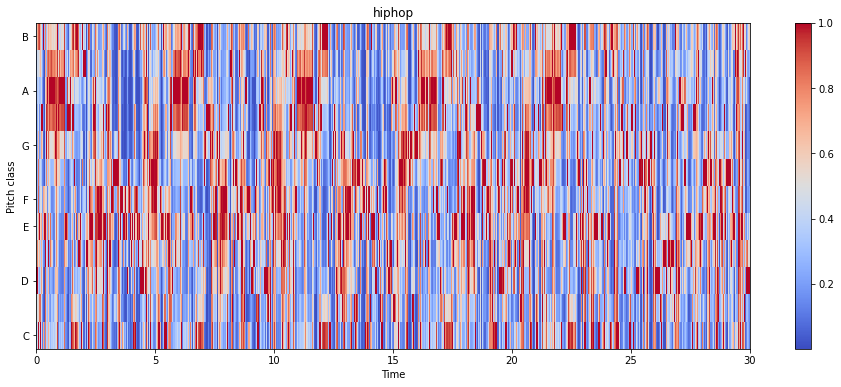

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[-0.10757446 -0.1585083  -0.12939453 ...  0.11965942  0.12826538
  0.12832642] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


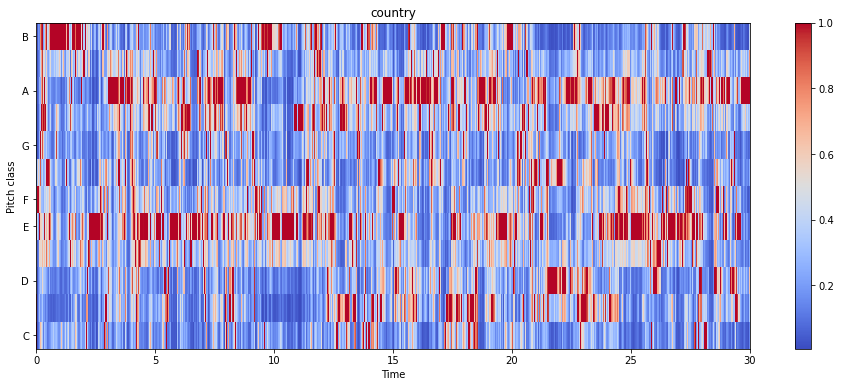

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Pass y=[ 0.00137329 -0.00704956  0.00338745 ...  0.17050171  0.16552734
  0.15499878] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


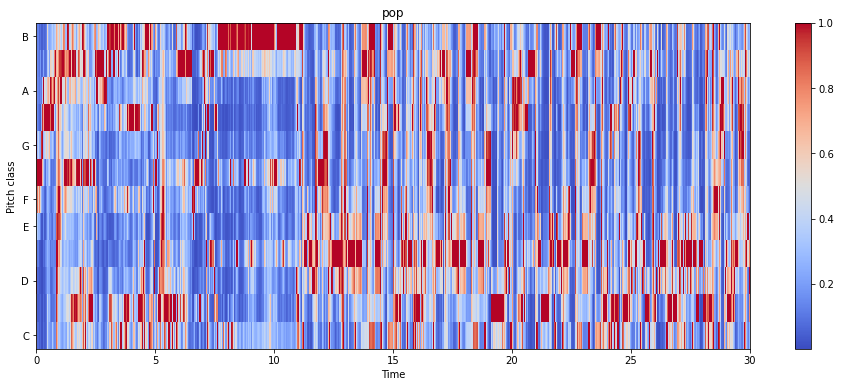

In [7]:
import librosa.display as lplt

for g in genres:
    g_path = os.path.join(audio_path, g)
    first_audio_path = os.path.join(g_path, os.listdir(g_path)[0])
    
    x, sr = librosa.load(first_audio_path)
    chroma = librosa.feature.chroma_stft(x, sr=sr)
    
    plt.figure(figsize=(16,6))
    lplt.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma', cmap='coolwarm')
    plt.colorbar()
    plt.title(g)
    plt.show()

## Zero Crossing Rate

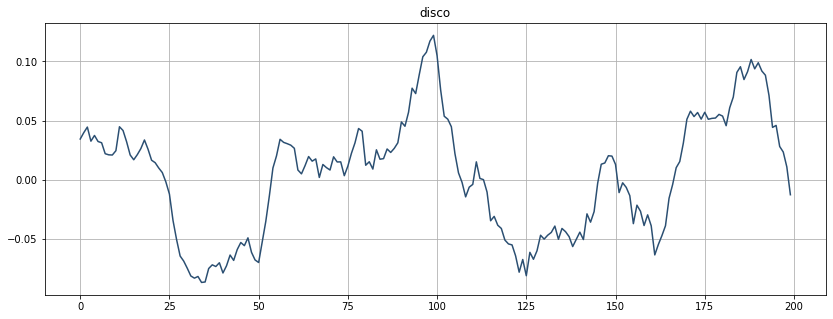

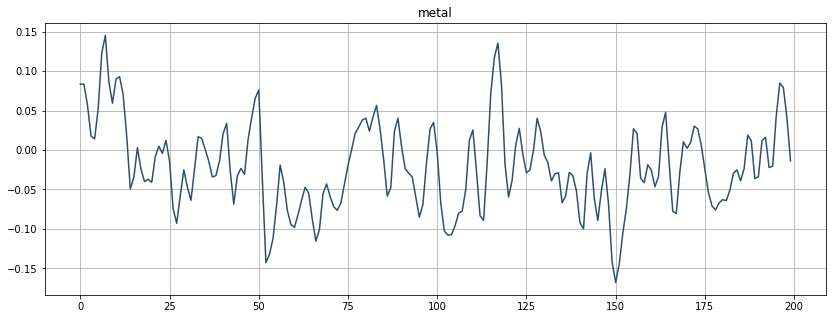

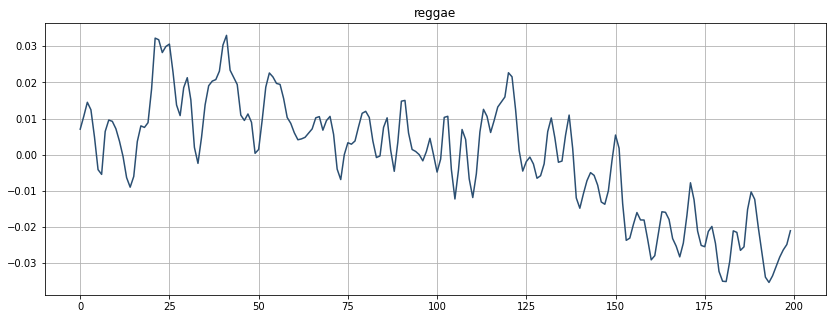

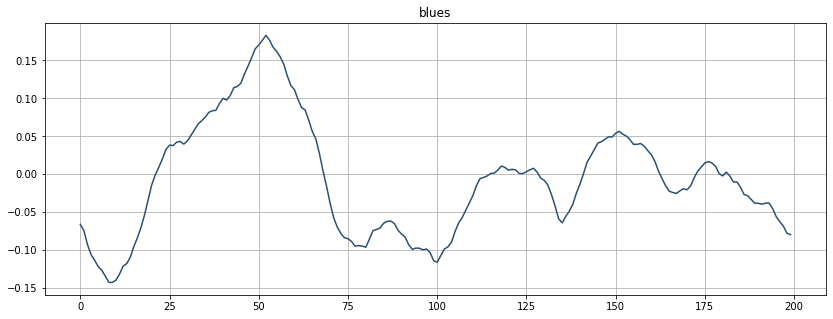

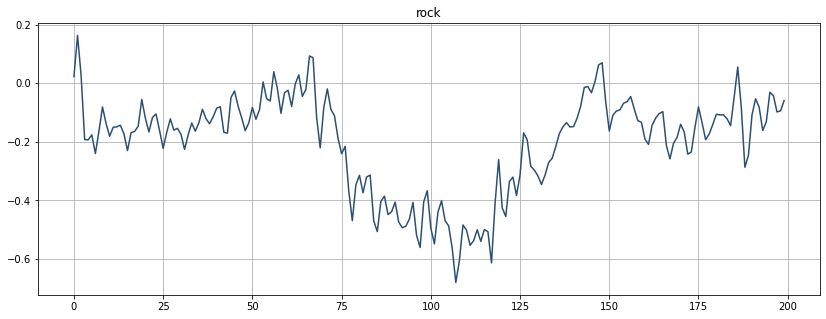

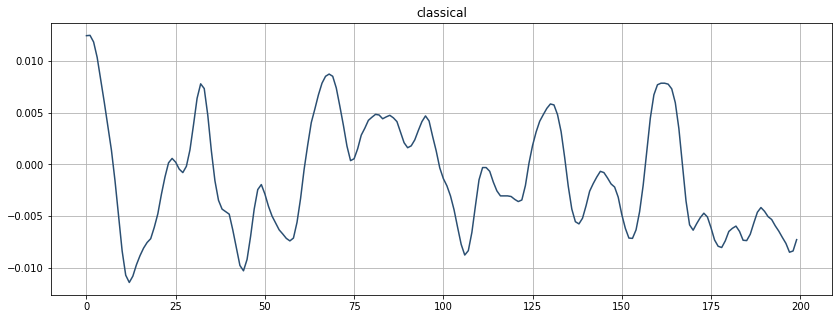

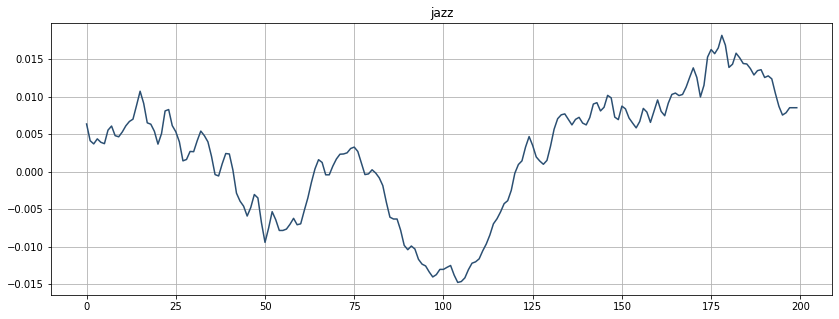

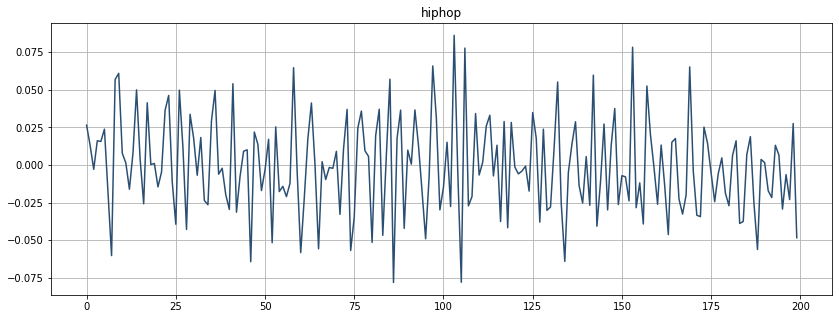

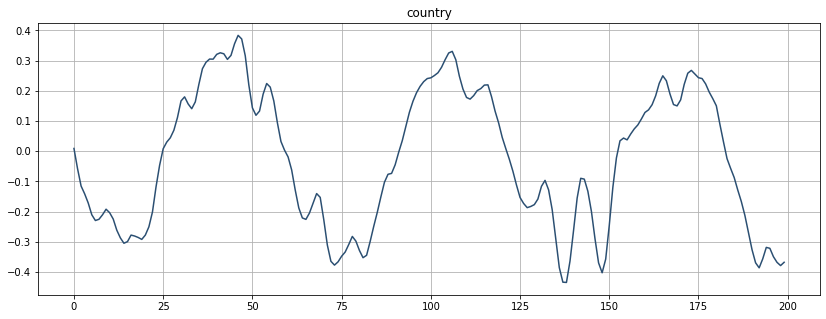

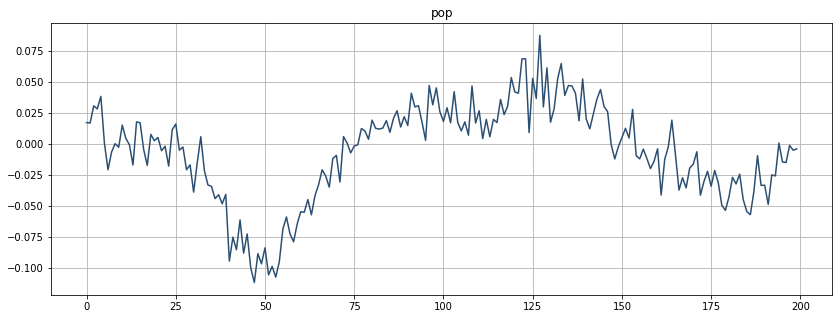

In [8]:
for g in genres:
    g_path = os.path.join(audio_path, g)
    first_audio_path = os.path.join(g_path, os.listdir(g_path)[0])
    
    x, sr = librosa.load(first_audio_path)
    start = 1000
    end = 1200
    
    plt.figure(figsize=(14, 5))
    plt.plot(x[start:end], color="#2B4F72")
    plt.title(g)
    plt.grid()

## MFCC

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[-0.0196228  -0.00567627  0.00927734 ...  0.01547241  0.01220703
  0.0319519 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


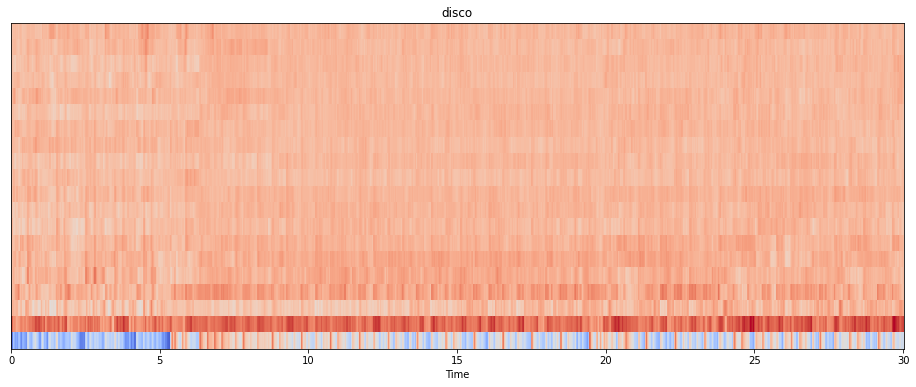

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[-0.07626343 -0.00305176  0.00396729 ... -0.13336182 -0.05142212
 -0.07611084] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


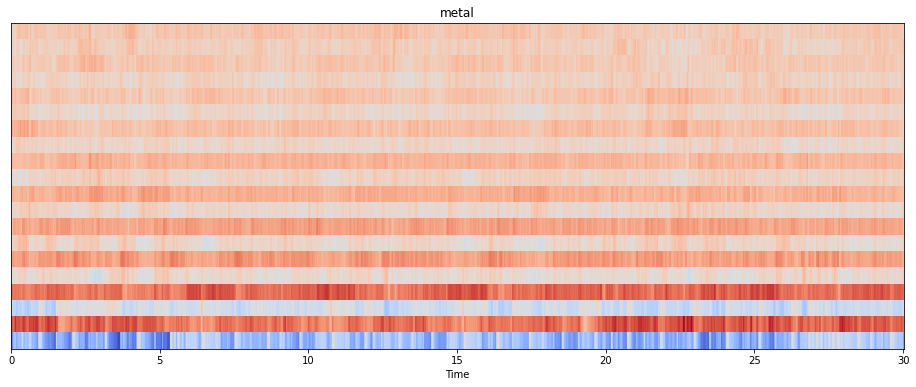

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[0.06112671 0.03997803 0.01208496 ... 0.03512573 0.06921387 0.02316284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


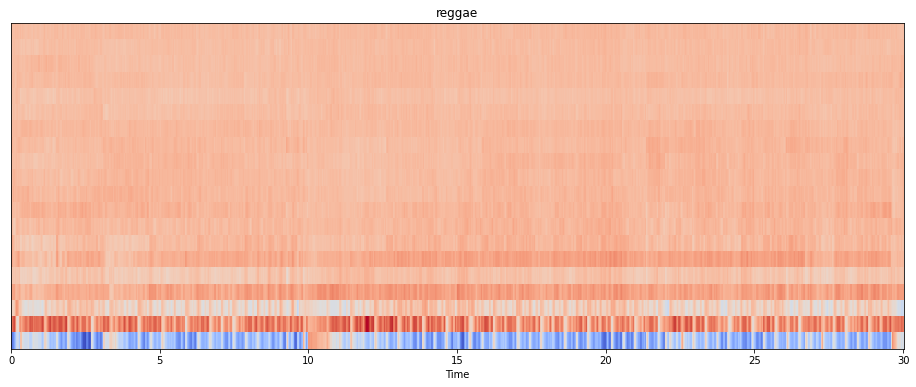

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[-0.01055908 -0.01623535 -0.012146   ...  0.0675354   0.07672119
  0.07815552] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


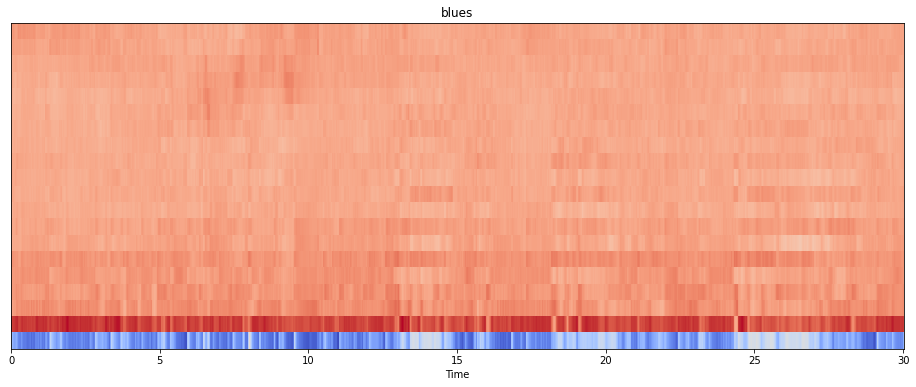

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[-0.0223999  -0.09103394 -0.16448975 ...  0.02685547 -0.00210571
 -0.05944824] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


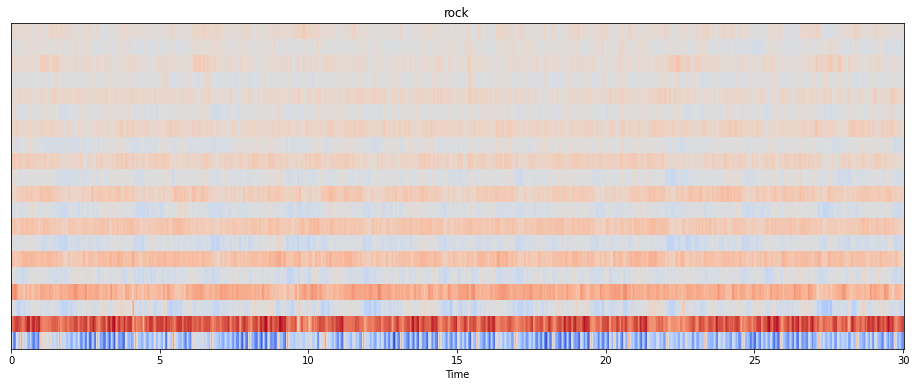

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[ 0.00784302  0.00726318  0.00582886 ... -0.00891113 -0.01077271
 -0.01013184] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


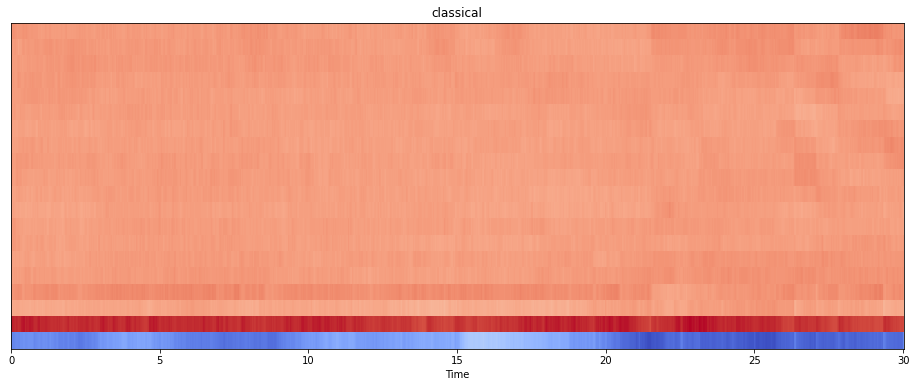

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[ 0.00662231  0.01126099  0.01037598 ... -0.02328491 -0.02392578
 -0.02212524] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


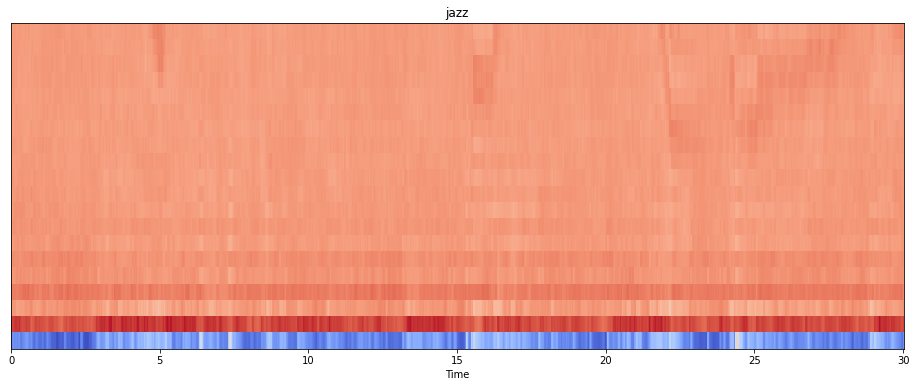

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[ 0.04315186  0.09747314  0.05752563 ... -0.03521729  0.00027466
  0.00268555] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


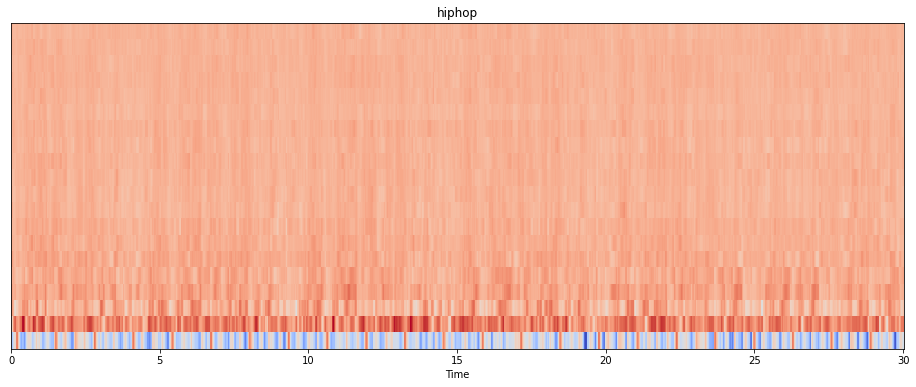

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[-0.10757446 -0.1585083  -0.12939453 ...  0.11965942  0.12826538
  0.12832642] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


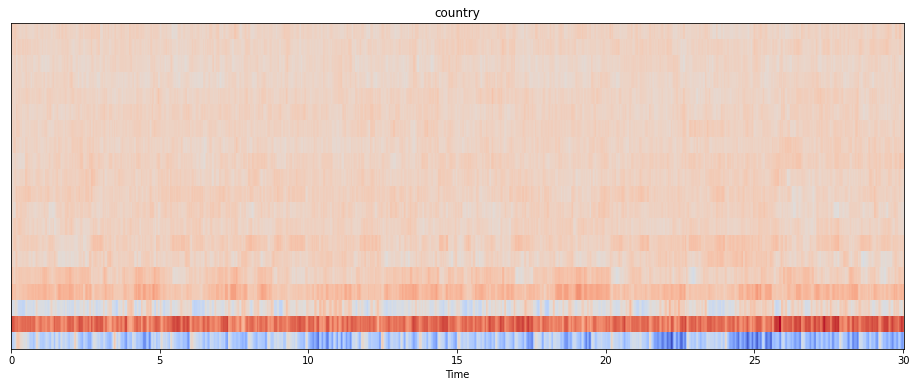

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[ 0.00137329 -0.00704956  0.00338745 ...  0.17050171  0.16552734
  0.15499878] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  


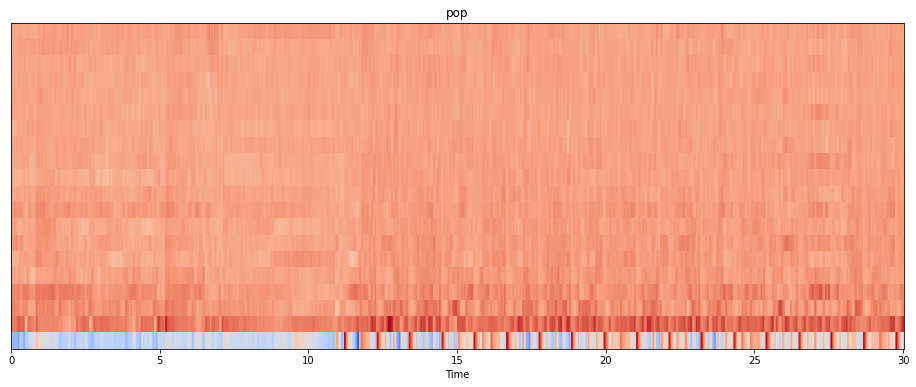

In [9]:
for g in genres:
    g_path = os.path.join(audio_path, g)
    first_audio_path = os.path.join(g_path, os.listdir(g_path)[0])
    
    x, sr = librosa.load(first_audio_path)
    mfccs = librosa.feature.mfcc(x, sr=sr)
    
    plt.figure(figsize=(16,6))
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')
    plt.title(g)
    plt.show()

## Spectral Centroid

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[-0.0196228  -0.00567627  0.00927734 ...  0.01547241  0.01220703
  0.0319519 ] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[-0.07626343 -0.00305176  0.00396729 ... -0.13336182 -0.05142212
 -0.07611084] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[0.06112671 0.03997803 0.01208496 ... 0.03512573 0.06921387 0.02316284] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: Pass y=[-0.01055908 -0.01623535 -0.012146   ...  0.0675354   0.07672119
  0.07815552] as keyword args. From version 0.10 passing thes

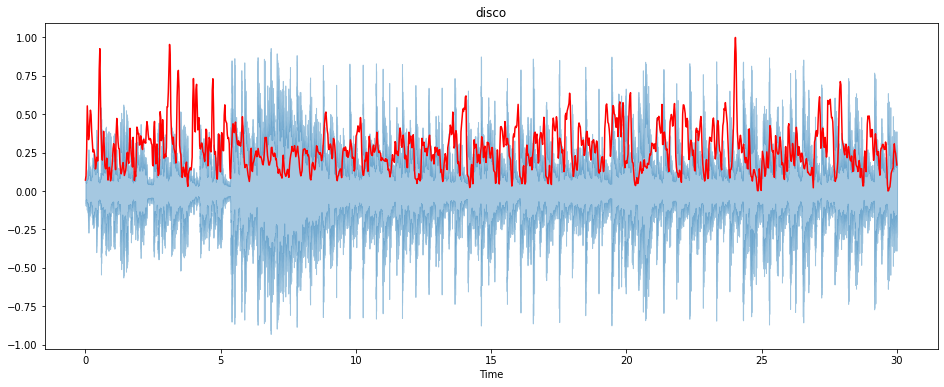

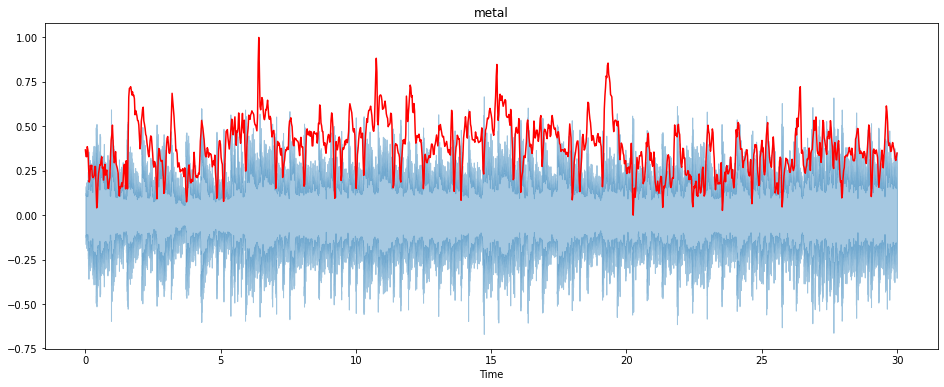

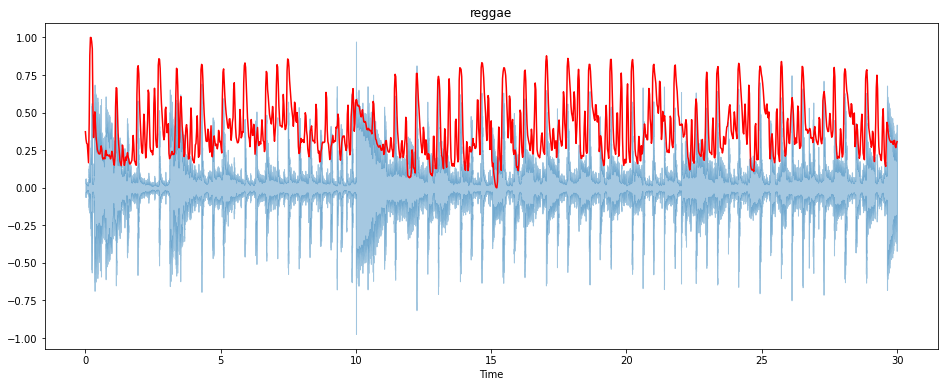

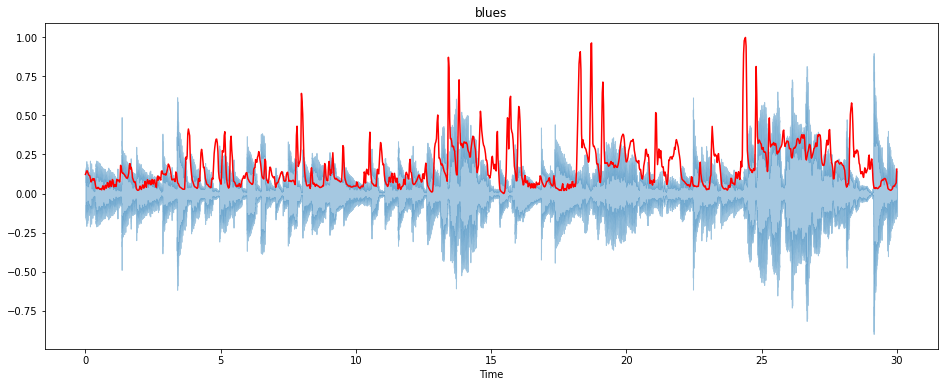

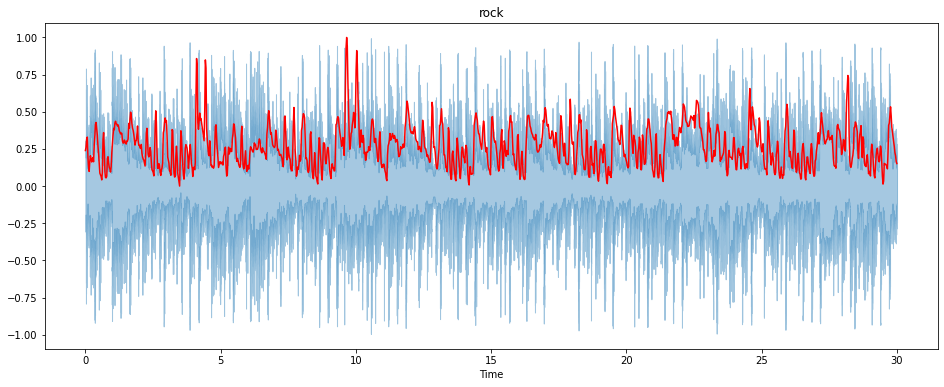

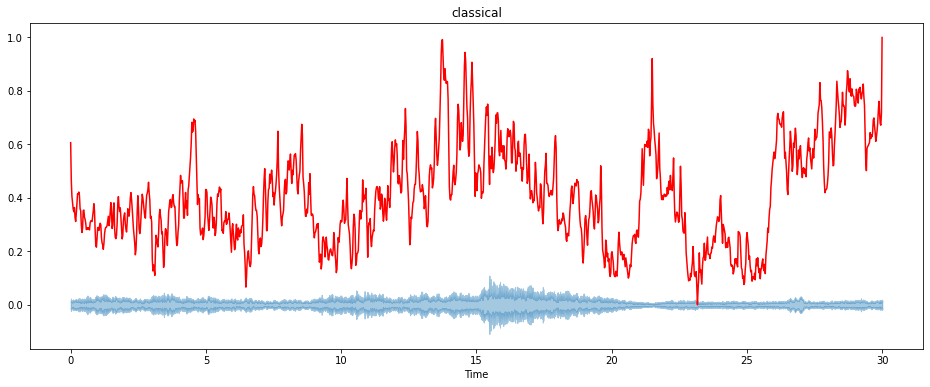

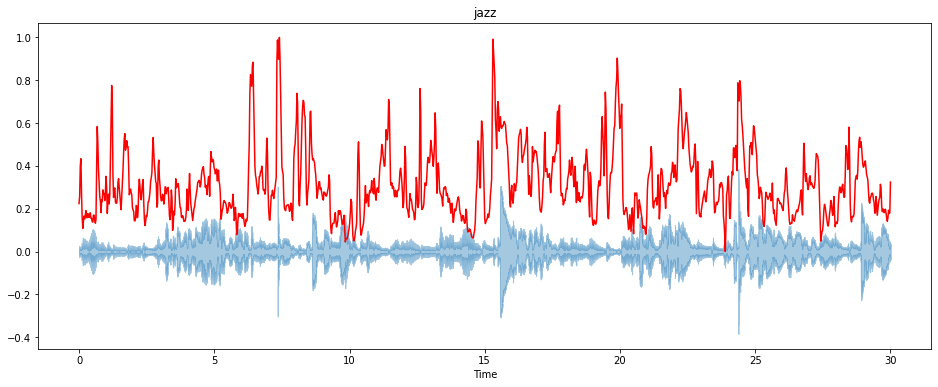

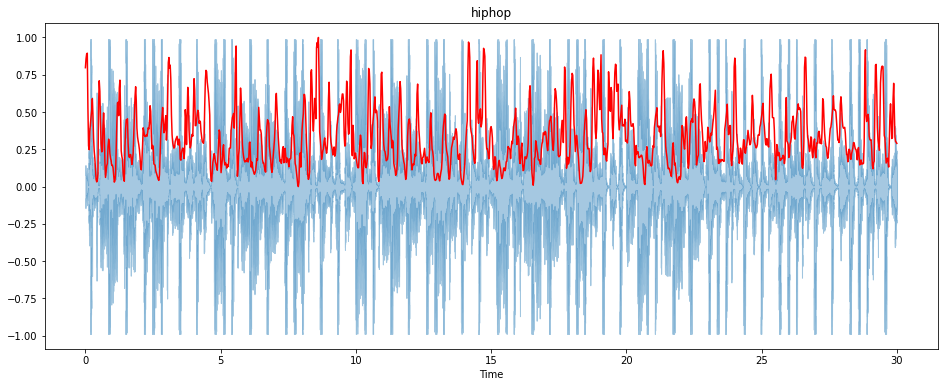

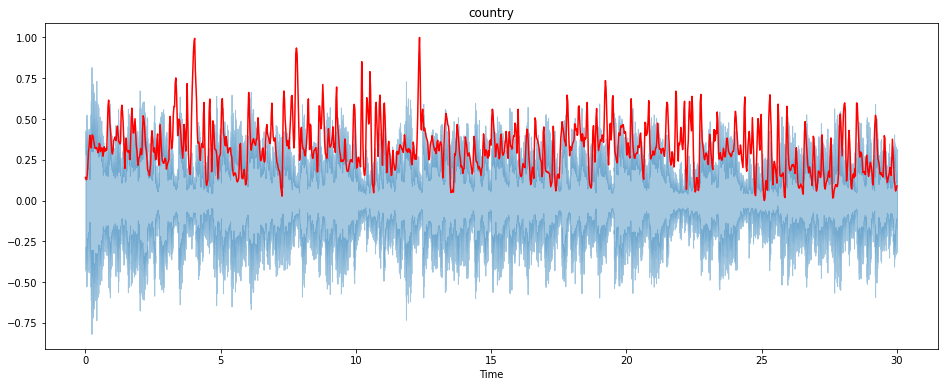

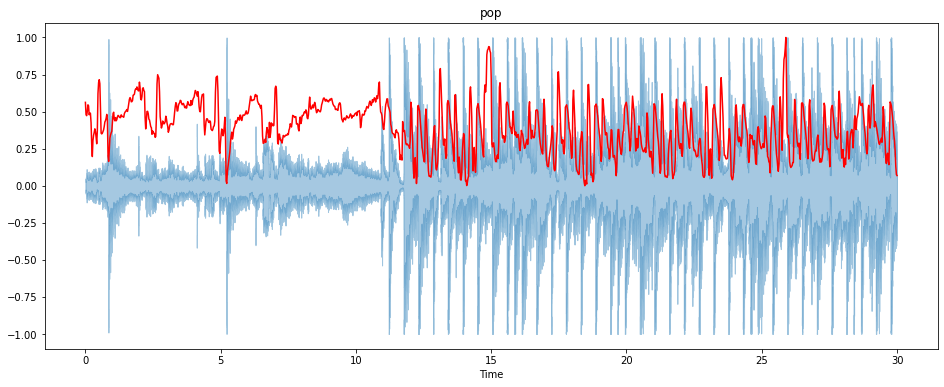

In [10]:
for g in genres:
    g_path = os.path.join(audio_path, g)
    first_audio_path = os.path.join(g_path, os.listdir(g_path)[0])
    
    x, sr = librosa.load(first_audio_path)
    spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]

    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)

    def normalize(x, axis=0):
        return minmax_scale(x, axis=axis)

    plt.figure(figsize=(16, 6))
    librosa.display.waveshow(y=x, sr=sr, alpha=0.4)
    plt.plot(t, normalize(spectral_centroids), color='r')
    plt.title(g)

# Load data

In [11]:
df = pd.read_csv(os.path.join(data_path, 'features_3_sec.csv'))
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [12]:
df.shape

(9990, 60)

In [13]:
df.dtypes

filename                    object
length                       int64
chroma_stft_mean           float64
chroma_stft_var            float64
rms_mean                   float64
rms_var                    float64
spectral_centroid_mean     float64
spectral_centroid_var      float64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
rolloff_mean               float64
rolloff_var                float64
zero_crossing_rate_mean    float64
zero_crossing_rate_var     float64
harmony_mean               float64
harmony_var                float64
perceptr_mean              float64
perceptr_var               float64
tempo                      float64
mfcc1_mean                 float64
mfcc1_var                  float64
mfcc2_mean                 float64
mfcc2_var                  float64
mfcc3_mean                 float64
mfcc3_var                  float64
mfcc4_mean                 float64
mfcc4_var                  float64
mfcc5_mean                 float64
mfcc5_var           

In [14]:
df = df.drop(labels='filename', axis=1)

# Pre-processing

In [15]:
class_list = df.iloc[:, -1]
convertor = LabelEncoder()

y = convertor.fit_transform(class_list)
y

array([0, 0, 0, ..., 9, 9, 9])

In [16]:
# Scaling the features

scaler = StandardScaler()
X = scaler.fit_transform(np.array(df.iloc[:, :-1]))

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

print(X_train.shape)
print(y_train.shape)

(7992, 58)
(7992,)


# Model


In [18]:
def trainModel(model, epochs, optimizer):
    batch_size = 128
    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics='accuracy'
    )
    return model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs,
                     batch_size=batch_size)

In [19]:
model = Sequential([
    Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.2),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(10, activation='softmax')
])
print (model.summary())
history = trainModel (model=model, epochs=300, optimizer='adam')

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 512)               30208     
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8

2022-12-28 07:42:14.442575: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.
2022-12-28 07:42:14.648760: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/300
63/63 [==============================] - 2s 11ms/step - loss: 1.5861 - accuracy: 0.4271 - val_loss: 1.0343 - val_accuracy: 0.6476
Epoch 2/300
63/63 [==============================] - 0s 8ms/step - loss: 1.0654 - accuracy: 0.6288 - val_loss: 0.8129 - val_accuracy: 0.7197
Epoch 3/300
63/63 [==============================] - 0s 8ms/step - loss: 0.8715 - accuracy: 0.7026 - val_loss: 0.7075 - val_accuracy: 0.7508
Epoch 4/300
63/63 [==============================] - 0s 8ms/step - loss: 0.7459 - accuracy: 0.7506 - val_loss: 0.5953 - val_accuracy: 0.7933
Epoch 5/300
63/63 [==============================] - 0s 8ms/step - loss: 0.6599 - accuracy: 0.7749 - val_loss: 0.5821 - val_accuracy: 0.8098
Epoch 6/300
63/63 [==============================] - 0s 8ms/step - loss: 0.5816 - accuracy: 0.8047 - val_loss: 0.5017 - val_accuracy: 0.8313
Epoch 7/300
63/63 [==============================] - 0s 8ms/step - loss: 0.5147 - accuracy: 0.8357 - val_loss: 0.4570 - val_accuracy: 0.8418
Epoch 8/300


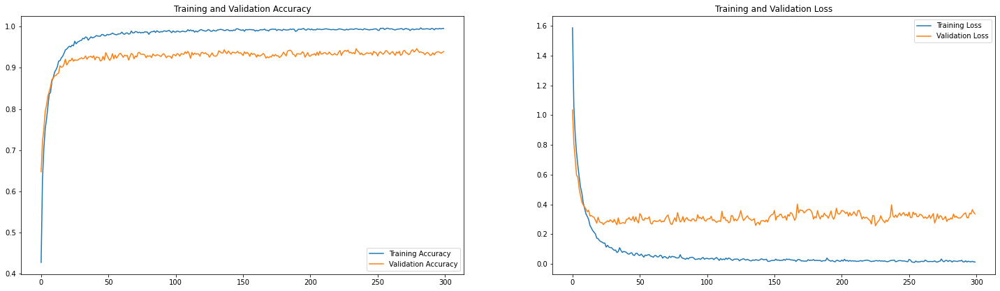

In [20]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(300)

plt.figure(figsize=(25, 15))
plt.subplot(2, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [26]:
predictions = model.predict(X_test)
predictions = np.argmax(predictions,axis=1)
predictions = predictions.reshape(1,-1)[0]
print(classification_report(y_test, predictions, target_names = genres))

              precision    recall  f1-score   support

       disco       0.94      0.98      0.96       227
       metal       0.96      0.98      0.97       212
      reggae       0.93      0.88      0.90       203
       blues       0.92      0.93      0.93       193
        rock       0.96      0.94      0.95       224
   classical       0.92      0.93      0.93       192
        jazz       0.98      0.97      0.97       202
      hiphop       0.93      0.94      0.94       178
     country       0.94      0.98      0.96       187
         pop       0.90      0.86      0.88       180

    accuracy                           0.94      1998
   macro avg       0.94      0.94      0.94      1998
weighted avg       0.94      0.94      0.94      1998



<AxesSubplot:>

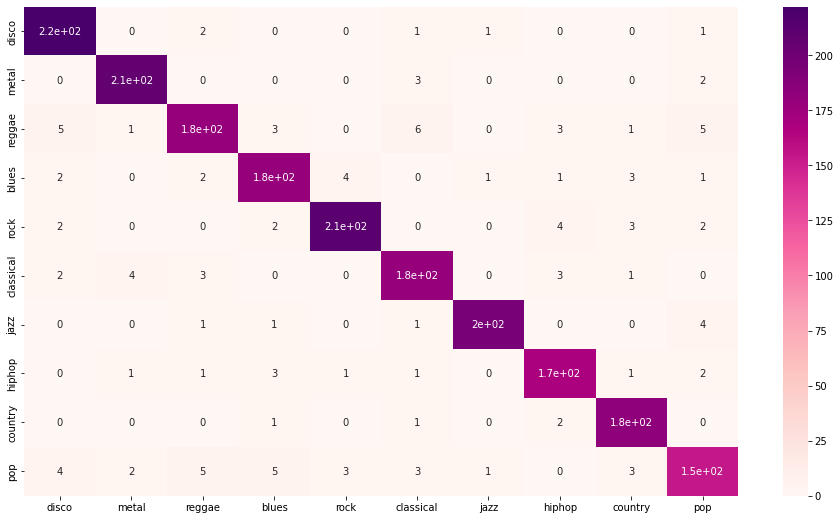

In [29]:
cm1 = confusion_matrix(y_test, predictions)
df_cm = pd.DataFrame(
    cm1, index = [i for i in genres],
    columns = [i for i in genres]
)

plt.figure(figsize = (16,9))
sn.heatmap(df_cm, annot=True,cmap="RdPu")

## Save model

In [ ]:
# !mkdir -p saved_model

# model.save('saved_model')